# Mental Health Analysis

## Overview

## Business Problem

## Data Understanding

The data comes from [kaggle.com](https://www.kaggle.com/datasets/sonia22222/students-mental-health-assessments?select=students_mental_health_survey.csv). It consists of over 7,000 mental health surveys where college students provided information regarding their courses, sleep quality, physical activity, social support, and many more aspects of their lives. In this project I will be converting the Depression_Score to a binary target. Three or higher is Yes, this student has depression, and two or below means no, this student does not have depression. My goal is to find which aspects of a student's life has the greatest impact on their probability of having depression. 

In [89]:
# Imports
import pandas as pd
import numpy as np
from sklearn.preprocessing import normalize, OneHotEncoder, StandardScaler, OrdinalEncoder, PolynomialFeatures
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.metrics import mean_squared_error, accuracy_score, recall_score, make_scorer, confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, FeatureUnion
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
import pickle
from sklearn.ensemble import GradientBoostingClassifier
import matplotlib.pyplot as plt

In [90]:
# Read the data in to a dataframe
df = pd.read_csv('data/students_mental_health_survey.csv')

In [91]:
df.head()

,Age,Course,Gender,CGPA,Stress_Level,Depression_Score,Anxiety_Score,Sleep_Quality,Physical_Activity,Diet_Quality,Social_Support,Relationship_Status,Substance_Use,Counseling_Service_Use,Family_History,Chronic_Illness,Financial_Stress,Extracurricular_Involvement,Semester_Credit_Load,Residence_Type
0,25,Others,Male,3.56,3,3,2,Good,Moderate,Good,Moderate,Married,Never,Never,No,No,2,Moderate,17,On-Campus
1,24,Engineering,Female,2.44,0,3,0,Average,Low,Average,Low,Single,Occasionally,Occasionally,No,No,3,Low,27,On-Campus
2,19,Business,Female,3.74,4,0,3,Good,Low,Average,Moderate,In a Relationship,Never,Occasionally,No,No,4,High,15,On-Campus
3,19,Computer Science,Male,3.65,2,1,0,Average,Low,Average,Moderate,Single,NaN,Never,No,No,4,Moderate,20,Off-Campus
4,18,Business,Male,3.40,3,3,4,Good,Low,Average,High,Married,Never,Never,No,Yes,0,High,23,On-Campus


In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7022 entries, 0 to 7021
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          7022 non-null   int64  
 1   Course                       7022 non-null   object 
 2   Gender                       7022 non-null   object 
 3   CGPA                         7010 non-null   float64
 4   Stress_Level                 7022 non-null   int64  
 5   Depression_Score             7022 non-null   int64  
 6   Anxiety_Score                7022 non-null   int64  
 7   Sleep_Quality                7022 non-null   object 
 8   Physical_Activity            7022 non-null   object 
 9   Diet_Quality                 7022 non-null   object 
 10  Social_Support               7022 non-null   object 
 11  Relationship_Status          7022 non-null   object 
 12  Substance_Use                7007 non-null   object 
 13  Counseling_Service

In [93]:
df.describe()

,Age,CGPA,Stress_Level,Depression_Score,Anxiety_Score,Financial_Stress,Semester_Credit_Load
count,7022.000000,7010.00000,7022.000000,7022.000000,7022.000000,7022.000000,7022.000000
mean,23.003418,3.49127,2.427941,2.254486,2.300484,2.453005,22.010538
std,3.853978,0.28742,1.638408,1.625193,1.624305,1.708995,4.358380
min,18.000000,2.44000,0.000000,0.000000,0.000000,0.000000,15.000000
25%,20.000000,3.29000,1.000000,1.000000,1.000000,1.000000,18.000000
50%,22.000000,3.50000,2.000000,2.000000,2.000000,2.000000,22.000000
75%,25.000000,3.70000,4.000000,3.000000,4.000000,4.000000,26.000000
max,35.000000,4.00000,5.000000,5.000000,5.000000,5.000000,29.000000


In [94]:
df['CGPA'].value_counts()

4.00    332
3.51    106
3.58    106
3.55    105
3.50    103
       ... 
2.67      1
2.44      1
2.63      1
2.58      1
2.49      1
Name: CGPA, Length: 143, dtype: int64

In [95]:
df['Sleep_Quality'].value_counts()

Good       3589
Average    2735
Poor        698
Name: Sleep_Quality, dtype: int64

In [96]:
df['Physical_Activity'].value_counts()

Moderate    3521
Low         2091
High        1410
Name: Physical_Activity, dtype: int64

In [97]:
df['Diet_Quality'].value_counts()

Average    4268
Good       1385
Poor       1369
Name: Diet_Quality, dtype: int64

In [98]:
df['Social_Support'].value_counts()

Moderate    3470
High        2176
Low         1376
Name: Social_Support, dtype: int64

In [99]:
df['Relationship_Status'].value_counts()

Single               3574
In a Relationship    2079
Married              1369
Name: Relationship_Status, dtype: int64

In [100]:
df['Substance_Use'].value_counts()

Never           5903
Occasionally     699
Frequently       405
Name: Substance_Use, dtype: int64

In [101]:
df['Counseling_Service_Use'].value_counts()

Never           4263
Occasionally    2081
Frequently       678
Name: Counseling_Service_Use, dtype: int64

In [102]:
df['Family_History'].value_counts()

No     4866
Yes    2156
Name: Family_History, dtype: int64

In [103]:
df['Chronic_Illness'].value_counts()

No     6678
Yes     344
Name: Chronic_Illness, dtype: int64

In [104]:
df['Financial_Stress'].value_counts()

0    1230
1    1184
2    1176
4    1161
3    1155
5    1116
Name: Financial_Stress, dtype: int64

In [105]:
df['Extracurricular_Involvement'].value_counts()

Moderate    3440
Low         2164
High        1418
Name: Extracurricular_Involvement, dtype: int64

In [106]:
df['Semester_Credit_Load'].value_counts()

27    513
17    509
28    491
15    472
18    468
19    467
24    466
16    466
22    461
29    461
25    460
26    456
23    446
21    444
20    442
Name: Semester_Credit_Load, dtype: int64

In [107]:
df['Age'].value_counts()

21    777
18    738
20    723
19    710
22    694
23    642
24    539
26    457
25    455
27    323
28    260
29    189
30    162
31    124
32     98
33     55
34     45
35     31
Name: Age, dtype: int64

In [108]:
df['Extracurricular_Involvement'].value_counts()

Moderate    3440
Low         2164
High        1418
Name: Extracurricular_Involvement, dtype: int64

In [109]:
df['Depression_Score'].value_counts()

3    1388
1    1308
2    1304
0    1295
4     884
5     843
Name: Depression_Score, dtype: int64

## Data Preparation

In order to prepare the data for preprocessing, I first dropped the 27 rows containing null values. Once I was working with a clean dataset, I then created a binary column for Depression. In the survey, students selected a number between 0 and 5 for their Depression. I created a column titled 'Depression Binary' that had 'Yes' if the depression score was 3 or higher, and 'No' if the depression score below 3. I did this in order to create a binary classification model. This type of model simplifies the process for the schools as they can use this to determine whether a student is more or less likely to need additional support. 

After this, the preprocessing steps performed included:

* scaling numerical columns
* one-hot encoding categorical columns
* ordinal encoding hierarchical categorical columns 

In [110]:
df.isna().sum()

Age                             0
Course                          0
Gender                          0
CGPA                           12
Stress_Level                    0
Depression_Score                0
Anxiety_Score                   0
Sleep_Quality                   0
Physical_Activity               0
Diet_Quality                    0
Social_Support                  0
Relationship_Status             0
Substance_Use                  15
Counseling_Service_Use          0
Family_History                  0
Chronic_Illness                 0
Financial_Stress                0
Extracurricular_Involvement     0
Semester_Credit_Load            0
Residence_Type                  0
dtype: int64

Dropped the 27 rows (.38% of the dataset) with null values.

In [111]:
# Drop Nulls
df.dropna(inplace=True)

In [112]:
# Confirm dropping Nulls worked
df.isna().sum()

Age                            0
Course                         0
Gender                         0
CGPA                           0
Stress_Level                   0
Depression_Score               0
Anxiety_Score                  0
Sleep_Quality                  0
Physical_Activity              0
Diet_Quality                   0
Social_Support                 0
Relationship_Status            0
Substance_Use                  0
Counseling_Service_Use         0
Family_History                 0
Chronic_Illness                0
Financial_Stress               0
Extracurricular_Involvement    0
Semester_Credit_Load           0
Residence_Type                 0
dtype: int64

I grouped the cumulative gpa's into buckets to allow for more meaningful data analysis.

In [113]:
# Group cumulative gpa's
df['CGPA'].loc[(df['CGPA'] >= 2.25) & (df['CGPA'] < 2.75)] = 2.5
df['CGPA'].loc[(df['CGPA'] >= 2.75) & (df['CGPA'] < 3.25)] = 3.0
df['CGPA'].loc[(df['CGPA'] >= 3.25) & (df['CGPA'] < 3.75)] = 3.5
df['CGPA'].loc[(df['CGPA'] >= 3.75) & (df['CGPA'] < 4.25)] = 4.0

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyd

In [114]:
# Confirm grouping worked
df['CGPA'].value_counts()

3.5    4138
4.0    1447
3.0    1378
2.5      32
Name: CGPA, dtype: int64

In [115]:
df

,Age,Course,Gender,CGPA,Stress_Level,Depression_Score,Anxiety_Score,Sleep_Quality,Physical_Activity,Diet_Quality,Social_Support,Relationship_Status,Substance_Use,Counseling_Service_Use,Family_History,Chronic_Illness,Financial_Stress,Extracurricular_Involvement,Semester_Credit_Load,Residence_Type
0,25,Others,Male,3.5,3,3,2,Good,Moderate,Good,Moderate,Married,Never,Never,No,No,2,Moderate,17,On-Campus
1,24,Engineering,Female,2.5,0,3,0,Average,Low,Average,Low,Single,Occasionally,Occasionally,No,No,3,Low,27,On-Campus
2,19,Business,Female,3.5,4,0,3,Good,Low,Average,Moderate,In a Relationship,Never,Occasionally,No,No,4,High,15,On-Campus
4,18,Business,Male,3.5,3,3,4,Good,Low,Average,High,Married,Never,Never,No,Yes,0,High,23,On-Campus
5,21,Medical,Female,3.5,2,4,3,Good,Moderate,Good,High,Single,Never,Never,No,No,5,Moderate,19,Off-Campus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7016,20,Law,Female,3.5,1,1,1,Average,Low,Average,Moderate,In a Relationship,Never,Occasionally,No,No,3,Moderate,29,Off-Campus
7017,20,Law,Female,3.5,3,1,5,Good,Low,Poor,High,Single,Never,Frequently,Yes,No,1,High,26,Off-Campus
7018,24,Medical,Female,3.5,3,4,1,Good,Moderate,Average,High,Single,Never,Occasionally,No,No,3,Low,15,Off-Campus
7019,26,Others,Male,3.5,4,5,1,Good,High,Poor,Moderate,Married,Never,Occasionally,No,Yes,4,Moderate,17,Off-Campus


In order to create a binary classification model, I converted the Depression Score into a Depression Binary of 'Yes' or 'No.' This way the school will be able to see at a high level which students are more likely to need additional support. 

In [116]:
# Create Binary Depression column for target variable
df.loc[df['Depression_Score'] >= 3, 'Depression_Binary'] = 1
df.loc[df['Depression_Score'] < 3, 'Depression_Binary'] = 0
df.drop('Depression_Score', axis=1, inplace=True)

Before I started modeling, I wanted to see if there were any obvious correlations between certain column values (such as poor, average, and good quality of sleep) and students being high risk for depression. To do this I created bar charts to show the high risk students for each column and the percentage breakdown of each value.

In [121]:
def plot_hr_column_perc(column):

    # Obtain percentage values for each ket in the category
    column_perc = df[column].loc[df['Depression_Binary']==1].value_counts(normalize=True)
    
    # Create empty lists for x and y to hold the keys and values
    x = []
    y = []

    # Assign keys and values to x and y respectively
    for key, value in column_perc.items():
            x.append(key)
            y.append(value)
    
    # Create a bar chart
    plt.bar(x, y)

    # Set the title and axis labels
    plt.title(f"Percentage of High Risk Students for {column}")
    plt.xlabel(column)
    plt.ylabel(f"Category Percentages of High Risk Students")

    # Show the plot
    plt.show()
    print('Percentage of each category in dataset')
    print(df[column].value_counts(normalize=True))
    print()

The graphs below were quite surprising to me as there did not appear to be many factors highly correlated with high risk of depression. Most graphs where there is a correlation, it does not seem very meaningful because it is typically just because that is the majority of the data. For example, according the the CGPA graph, the majority of high risk students have a 3.5 cgpa. This makes sense because in the dataset, students with around a 3.5 cgpa account for about 59% of the population. 

Age


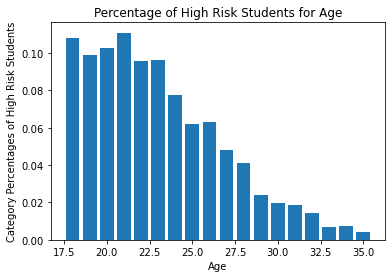

Percentage of each category in dataset
21    0.110936
18    0.105075
20    0.103074
19    0.101215
22    0.098642
23    0.091065
24    0.076769
26    0.064904
25    0.064904
27    0.046176
28    0.036741
29    0.026876
30    0.023159
31    0.017727
32    0.014010
33    0.007863
34    0.006433
35    0.004432
Name: Age, dtype: float64

None
Course


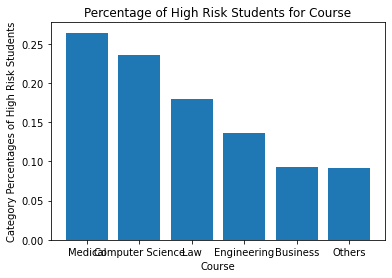

Percentage of each category in dataset
Medical             0.299643
Law                 0.197427
Engineering         0.152538
Computer Science    0.146104
Business            0.102216
Others              0.102073
Name: Course, dtype: float64

None
Gender


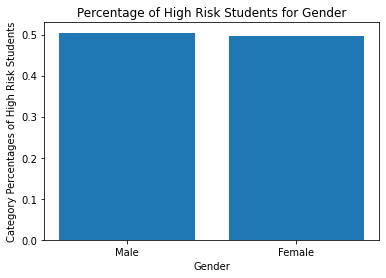

Percentage of each category in dataset
Male      0.505504
Female    0.494496
Name: Gender, dtype: float64

None
CGPA


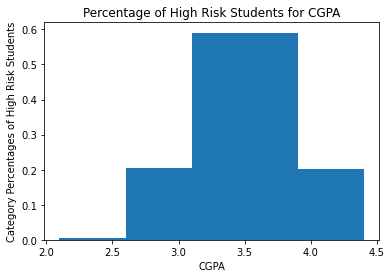

Percentage of each category in dataset
3.5    0.591565
4.0    0.206862
3.0    0.196998
2.5    0.004575
Name: CGPA, dtype: float64

None
Stress_Level


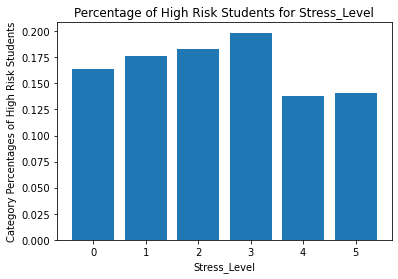

Percentage of each category in dataset
3    0.199714
2    0.182130
1    0.175268
0    0.156397
5    0.144818
4    0.141673
Name: Stress_Level, dtype: float64

None
Anxiety_Score


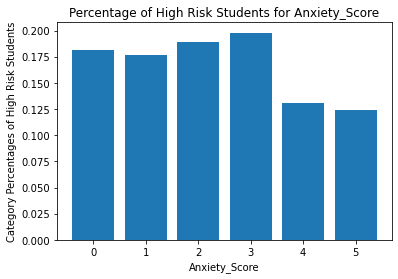

Percentage of each category in dataset
3    0.203431
2    0.184846
1    0.181129
0    0.176412
4    0.129664
5    0.124518
Name: Anxiety_Score, dtype: float64

None
Sleep_Quality


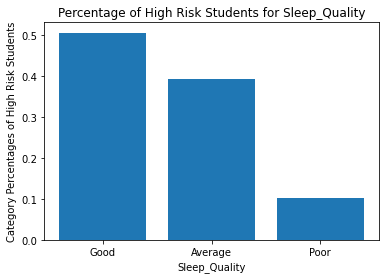

Percentage of each category in dataset
Good       0.511651
Average    0.388992
Poor       0.099357
Name: Sleep_Quality, dtype: float64

None
Physical_Activity


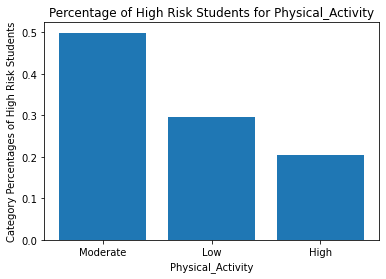

Percentage of each category in dataset
Moderate    0.501072
Low         0.298070
High        0.200858
Name: Physical_Activity, dtype: float64

None
Diet_Quality


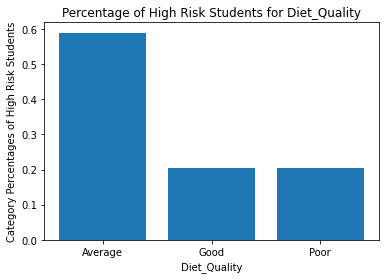

Percentage of each category in dataset
Average    0.608006
Good       0.197141
Poor       0.194853
Name: Diet_Quality, dtype: float64

None
Social_Support


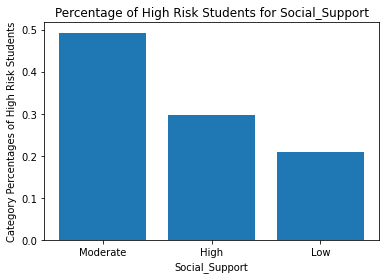

Percentage of each category in dataset
Moderate    0.494210
High        0.309507
Low         0.196283
Name: Social_Support, dtype: float64

None
Relationship_Status


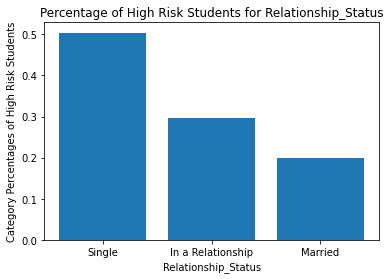

Percentage of each category in dataset
Single               0.509221
In a Relationship    0.295783
Married              0.194996
Name: Relationship_Status, dtype: float64

None
Substance_Use


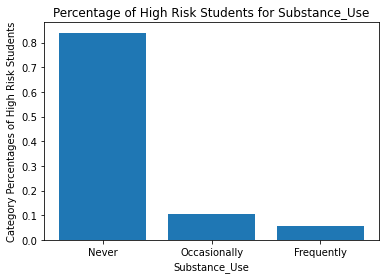

Percentage of each category in dataset
Never           0.842602
Occasionally    0.099643
Frequently      0.057756
Name: Substance_Use, dtype: float64

None
Counseling_Service_Use


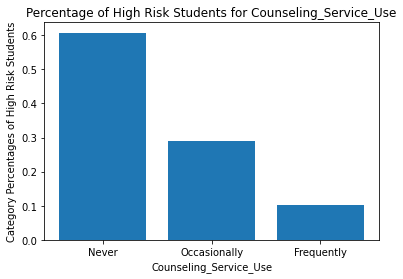

Percentage of each category in dataset
Never           0.607577
Occasionally    0.295783
Frequently      0.096640
Name: Counseling_Service_Use, dtype: float64

None
Family_History


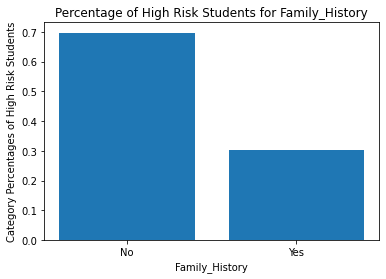

Percentage of each category in dataset
No     0.692495
Yes    0.307505
Name: Family_History, dtype: float64

None
Chronic_Illness


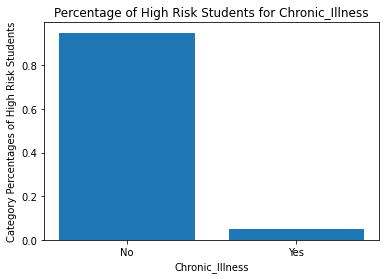

Percentage of each category in dataset
No     0.950965
Yes    0.049035
Name: Chronic_Illness, dtype: float64

None
Financial_Stress


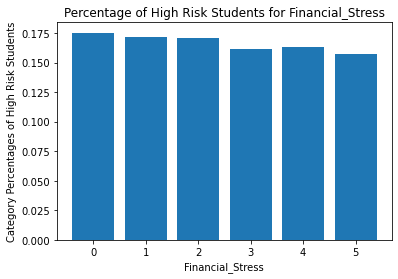

Percentage of each category in dataset
0    0.175125
1    0.168835
2    0.166976
4    0.165261
3    0.164689
5    0.159114
Name: Financial_Stress, dtype: float64

None
Extracurricular_Involvement


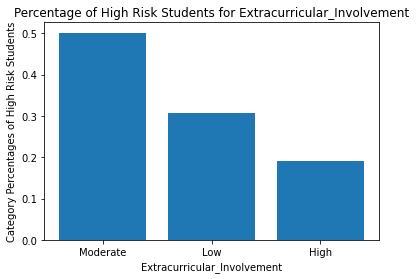

Percentage of each category in dataset
Moderate    0.489778
Low         0.308363
High        0.201858
Name: Extracurricular_Involvement, dtype: float64

None
Semester_Credit_Load


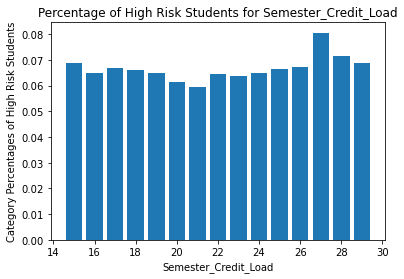

Percentage of each category in dataset
27    0.073052
17    0.072337
28    0.070050
15    0.067334
18    0.066762
19    0.066619
16    0.066476
24    0.066190
29    0.065761
25    0.065475
26    0.065046
22    0.065046
23    0.063760
21    0.063331
20    0.062759
Name: Semester_Credit_Load, dtype: float64

None
Residence_Type


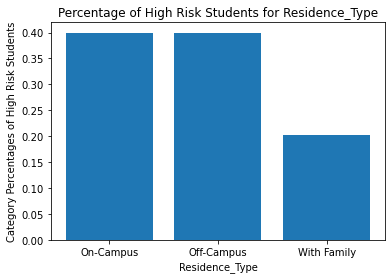

Percentage of each category in dataset
On-Campus      0.401001
Off-Campus     0.396569
With Family    0.202430
Name: Residence_Type, dtype: float64

None
Depression_Binary


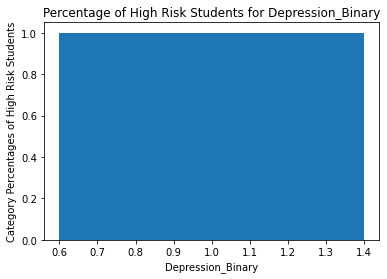

Percentage of each category in dataset
0.0    0.556254
1.0    0.443746
Name: Depression_Binary, dtype: float64

None


In [122]:
# Create a graph for every column
for column in df.columns:
    print(column)
    print(plot_hr_column_perc(column));

I decided to make a visual of the percentage of each category's high risk students. Many categories above could be misleading because it is based on count instead of percentage. For example, very few students are high risk who live with their family, but living with family is also the smallest subset of students in the dataset. In order to get a better picture of how living with family affected risk of depression, I would prefer to see risk breakdown of the percentage of students who live at home. 

In [129]:
def plot_hr_perc(column):

    # Obtain percentage values for each ket in the category
    perc = df[column].loc[df['Depression_Binary']==1].value_counts() / df[column].value_counts()
    
    # Create empty lists for x and y to hold the keys and values
    x = []
    y = []

    # Assign keys and values to x and y respectively
    for key, value in perc.items():
            x.append(key)
            y.append(value)
    
    # Create a bar chart
    plt.bar(x, y)

    # Set the title and axis labels
    plt.title(f"Percentage of High Risk Students for {column}")
    plt.xlabel(column)
    plt.ylabel(f"Category Percentages of High Risk Students")

    # Show the plot
    plt.show()
    print('Percentage Breakdown of Categories')
    print(df[column].value_counts(normalize=True))
    print()

The graphs below show the percentage of students that are high risk for each category in each column. Most column categories have a fairly even spread. For example, the Stress Level graph shows that just under 50% of students with stress levels of 0 are high risk for Depression. However, the graph also shows that for stress levels of 1 through 5, meaning that stress levels are not a good indicator for risk of depression. Surpisingly, it is the same story for Age, Anxiety, Sleep, Physical Activity, Diet, Social Support, Relationship Status, Substance Use, Counseling Service Use, Family History, Chronic Illness, Financial Stress, Extracurricular Involvement, Semester Credit Load and Residence Type. 

The column that does stand out as having some correlation with high risk is Course. According to the graph, out of all computer science majors who completed this survey, about 70% of them were high risk for depression, while all other courses were around 40%. 

Age


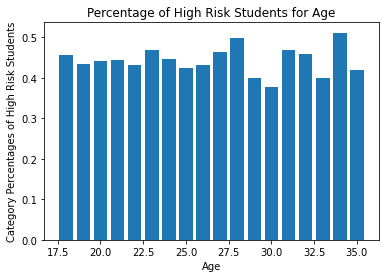

Percentage Breakdown of Categories
21    0.110936
18    0.105075
20    0.103074
19    0.101215
22    0.098642
23    0.091065
24    0.076769
26    0.064904
25    0.064904
27    0.046176
28    0.036741
29    0.026876
30    0.023159
31    0.017727
32    0.014010
33    0.007863
34    0.006433
35    0.004432
Name: Age, dtype: float64

None
Course


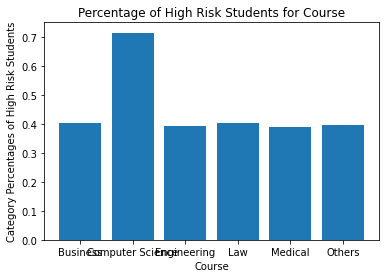

Percentage Breakdown of Categories
Medical             0.299643
Law                 0.197427
Engineering         0.152538
Computer Science    0.146104
Business            0.102216
Others              0.102073
Name: Course, dtype: float64

None
Gender


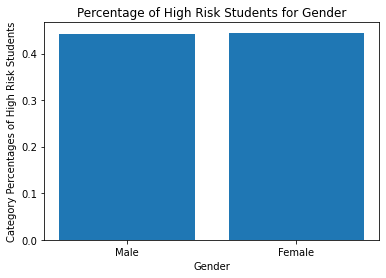

Percentage Breakdown of Categories
Male      0.505504
Female    0.494496
Name: Gender, dtype: float64

None
CGPA


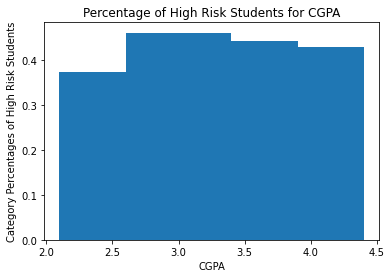

Percentage Breakdown of Categories
3.5    0.591565
4.0    0.206862
3.0    0.196998
2.5    0.004575
Name: CGPA, dtype: float64

None
Stress_Level


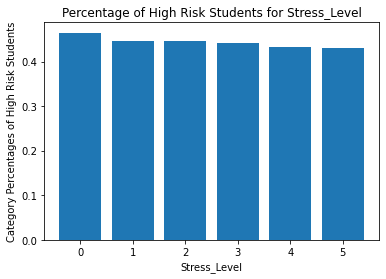

Percentage Breakdown of Categories
3    0.199714
2    0.182130
1    0.175268
0    0.156397
5    0.144818
4    0.141673
Name: Stress_Level, dtype: float64

None
Anxiety_Score


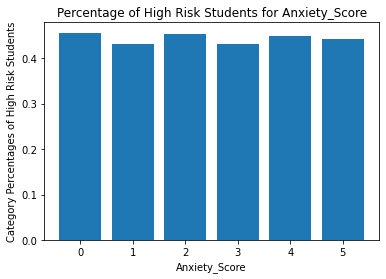

Percentage Breakdown of Categories
3    0.203431
2    0.184846
1    0.181129
0    0.176412
4    0.129664
5    0.124518
Name: Anxiety_Score, dtype: float64

None
Sleep_Quality


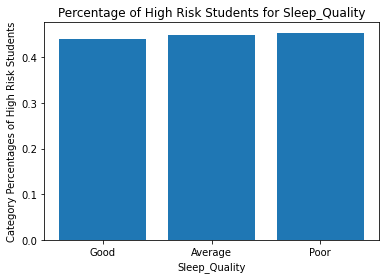

Percentage Breakdown of Categories
Good       0.511651
Average    0.388992
Poor       0.099357
Name: Sleep_Quality, dtype: float64

None
Physical_Activity


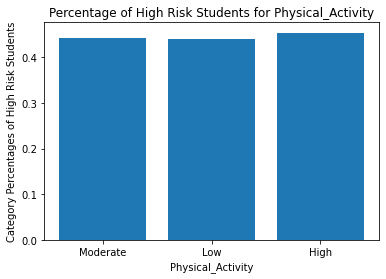

Percentage Breakdown of Categories
Moderate    0.501072
Low         0.298070
High        0.200858
Name: Physical_Activity, dtype: float64

None
Diet_Quality


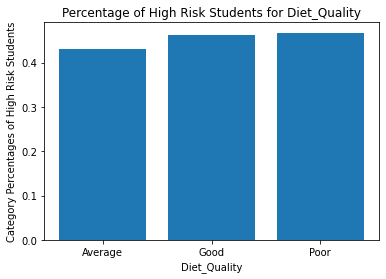

Percentage Breakdown of Categories
Average    0.608006
Good       0.197141
Poor       0.194853
Name: Diet_Quality, dtype: float64

None
Social_Support


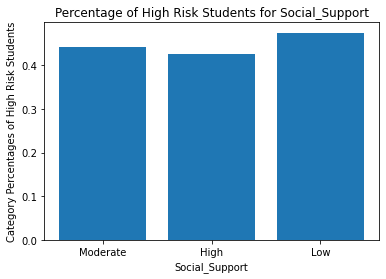

Percentage Breakdown of Categories
Moderate    0.494210
High        0.309507
Low         0.196283
Name: Social_Support, dtype: float64

None
Relationship_Status


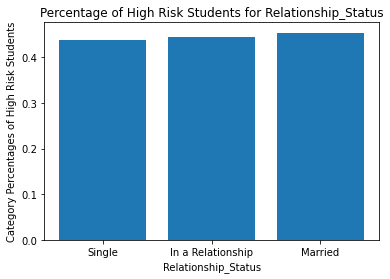

Percentage Breakdown of Categories
Single               0.509221
In a Relationship    0.295783
Married              0.194996
Name: Relationship_Status, dtype: float64

None
Substance_Use


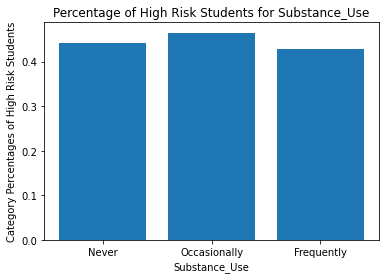

Percentage Breakdown of Categories
Never           0.842602
Occasionally    0.099643
Frequently      0.057756
Name: Substance_Use, dtype: float64

None
Counseling_Service_Use


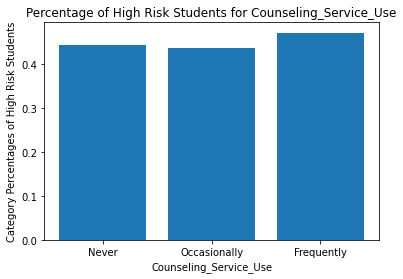

Percentage Breakdown of Categories
Never           0.607577
Occasionally    0.295783
Frequently      0.096640
Name: Counseling_Service_Use, dtype: float64

None
Family_History


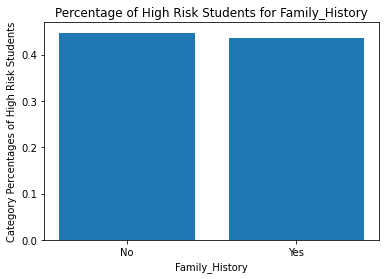

Percentage Breakdown of Categories
No     0.692495
Yes    0.307505
Name: Family_History, dtype: float64

None
Chronic_Illness


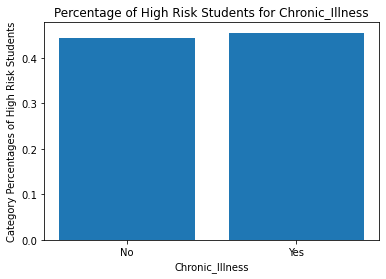

Percentage Breakdown of Categories
No     0.950965
Yes    0.049035
Name: Chronic_Illness, dtype: float64

None
Financial_Stress


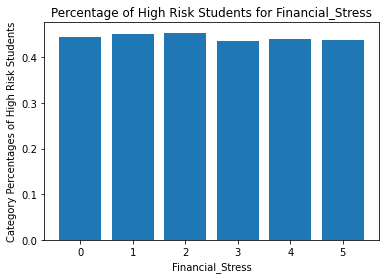

Percentage Breakdown of Categories
0    0.175125
1    0.168835
2    0.166976
4    0.165261
3    0.164689
5    0.159114
Name: Financial_Stress, dtype: float64

None
Extracurricular_Involvement


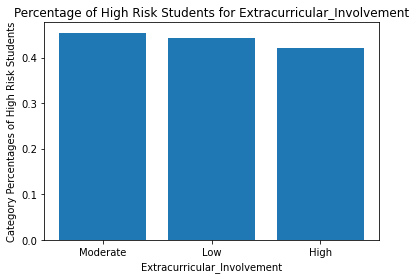

Percentage Breakdown of Categories
Moderate    0.489778
Low         0.308363
High        0.201858
Name: Extracurricular_Involvement, dtype: float64

None
Semester_Credit_Load


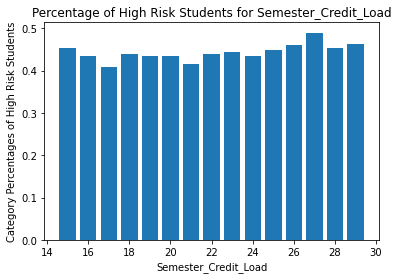

Percentage Breakdown of Categories
27    0.073052
17    0.072337
28    0.070050
15    0.067334
18    0.066762
19    0.066619
16    0.066476
24    0.066190
29    0.065761
25    0.065475
26    0.065046
22    0.065046
23    0.063760
21    0.063331
20    0.062759
Name: Semester_Credit_Load, dtype: float64

None
Residence_Type


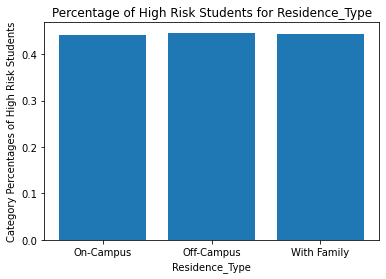

Percentage Breakdown of Categories
On-Campus      0.401001
Off-Campus     0.396569
With Family    0.202430
Name: Residence_Type, dtype: float64

None
Depression_Binary


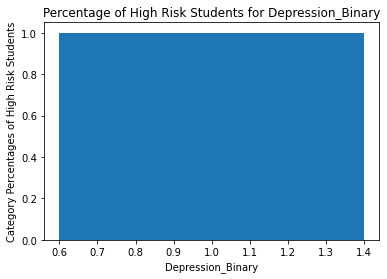

Percentage Breakdown of Categories
0.0    0.556254
1.0    0.443746
Name: Depression_Binary, dtype: float64

None


In [130]:
# Create a graph for every column
for column in df.columns:
    print(column)
    print(plot_hr_perc(column));

### Preprocessing Data

The following numerical columns were scaled:
* Age, Semester Credit Load, CGPA <br>
These columns had numerical, continuous values. 

The following categorical columns were one-hot encoded:
* Course, Gender, Relationship Status, Family History, Residence Type, Chronic Illness <br>
These columns had categorical values with no rank or order.

The following hierarchical categorical columns were ordinal encoded:
* Sleep Quality, Physical Activity, Diet Quality, Social Support, Substance Use, Counseling Service Use, Extracurricular Involvement <br>
These columns had hierarchical categories that had an inherent order. 
For example, Sleep Quality was either 'Poor', 'Average', or 'Good' and Social Support was either 'Low', 'Moderate', or 'High'. 

In [28]:
# Define columns for scaling, one hot encoding, and ordinal encoding
continuous_cols = ['Age', 'Semester_Credit_Load', 'CGPA']
ohe_cols = ['Course', 'Gender', 'Relationship_Status', 'Family_History', 'Residence_Type', 'Chronic_Illness']
ordinal_cols = ['Sleep_Quality', 'Physical_Activity', 'Diet_Quality', 'Social_Support', 'Substance_Use', 
               'Counseling_Service_Use', 'Extracurricular_Involvement']

# Order Ordinal Column Entries
sleep_ord = ['Poor', 'Average', 'Good']
phys_ord = ['Low', 'Moderate', 'High']
diet_ord = ['Poor', 'Average', 'Good']
social_ord = ['Low', 'Moderate', 'High']
subst_ord = ['Never', 'Occasionally', 'Frequently']
counsel_ord = ['Never', 'Occasionally', 'Frequently']
extracurric_ord = ['Low', 'Moderate', 'High']

# Create a column transformer for preprocessing
preprocessor = ColumnTransformer(remainder='passthrough',
    transformers=[
        ('num', StandardScaler(), continuous_cols),  
        ('ohe', OneHotEncoder(handle_unknown='ignore'), ohe_cols),
        ('ord', OrdinalEncoder(categories=[sleep_ord, phys_ord, diet_ord, 
                                           social_ord, subst_ord, counsel_ord, extracurric_ord]), 
         ordinal_cols)])

Once all the actions above were completed, the data was ready for a train/test split in order to begin the modeling process.

In [29]:
y = df.pop('Depression_Binary')
X = df

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=333)

In [30]:
X_train

,Age,Course,Gender,CGPA,Stress_Level,Anxiety_Score,Sleep_Quality,Physical_Activity,Diet_Quality,Social_Support,Relationship_Status,Substance_Use,Counseling_Service_Use,Family_History,Chronic_Illness,Financial_Stress,Extracurricular_Involvement,Semester_Credit_Load,Residence_Type
4584,21,Engineering,Female,3.08,0,3,Good,Low,Good,High,Married,Never,Never,Yes,No,1,High,17,With Family
118,23,Engineering,Female,3.10,0,0,Good,High,Good,High,Married,Never,Never,No,No,0,Moderate,16,On-Campus
311,22,Business,Female,3.65,2,2,Good,Moderate,Poor,Moderate,Single,Never,Never,No,No,4,Moderate,20,Off-Campus
4537,24,Engineering,Male,3.44,5,3,Average,Moderate,Average,Low,In a Relationship,Never,Never,No,No,5,Moderate,29,Off-Campus
4389,26,Law,Male,3.36,1,0,Poor,Moderate,Average,Moderate,Single,Never,Never,Yes,No,0,Low,28,On-Campus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5503,22,Medical,Female,3.07,1,5,Average,Low,Average,High,Single,Never,Never,No,No,5,Moderate,19,With Family
6076,25,Business,Female,3.63,1,3,Good,Low,Average,Low,Single,Never,Never,Yes,No,1,Moderate,16,Off-Campus
1452,25,Law,Male,3.25,2,5,Good,Low,Average,Moderate,Single,Never,Occasionally,Yes,Yes,5,Low,17,On-Campus
982,23,Engineering,Female,3.73,2,3,Average,Moderate,Poor,Low,Married,Never,Never,Yes,No,4,Low,22,With Family


In [31]:
y_train.value_counts()

0.0    2940
1.0    2306
Name: Depression_Binary, dtype: int64

In [32]:
# Confirming preprocessor outputs correct number of rows of data
preprocessor.fit_transform(X_train).shape

(5246, 31)

## Modeling

In order to analyze the performance of the models I built, I focused on recall. This model could be used at schools to help determine which students may need additional support in and out of the classroom. I decided it was best to minimize false negatives (saying a student is less likely to have depression when they are actually more likely), because that would be neglecting to offer additional support when it is needed. A false positive on the other hand, would be a small cost to the school, but ultimately would just give more support to a student, which is never a bad thing. 

For this problem I needed to use classification models. There are many options to use and I wasn't sure which would be most appropriate so I created a wide variety. First, I started with a decision tree purposefully trying to overfit the model to confirm that we had the right data in order to build a successful predictive model.

Every iteration of our models from then on was highly focused on reducing overfitting while maintaining or increasing the recall score.

## Evaluation

In order to evaluate the models consistently, I created a function that would show each model's cross validation and training scores for recall, f1, and accuracy. It also showed a confusion matrix for a visual of a breakdown of the model's predictions. While all of these scores weere useful for the interpretation of the model, the tweaking of the models were to improve the recall score. 

In [33]:
# Defining scorers to evaluate models
recall_scorer = make_scorer(recall_score)
# f1_scorer = make_scorer(f1_score)

This function compares the model's performance on training data to the model's performance with cross validation.

In [50]:
# Compare training and cross validation scores
def cv_scores(model):
        
    # Define the predictions from the Pipeline using the training data
    y_pred = model.predict(X_train)
    
    # Evaluate the scores 
    print('Train Recall: ', recall_score(y_train, y_pred))
    print('CV Recall: ', cross_val_score(model, X_train, y_train, scoring=recall_scorer).mean())

#     print('')
#     print('Train F1: ', f1_score(y_train, y_pred))
#     print('CV F1: ', cross_val_score(model, X_train, y_train, scoring=f1_scorer).mean())
   
    print('')
    print('Train Accuracy: ', accuracy_score(y_train, y_pred))
    print('CV Accuracy: ', cross_val_score(model, X_train, y_train).mean())
    
    
    # Creating confusion matrix
    cf = confusion_matrix(y_train, y_pred)
    # Displaying confusion matrix
    ConfusionMatrixDisplay(cf, display_labels=['No', 'Yes']).plot()

All of the models I experimented with were tweaked using Grid Search. I created the function below to consistently evaluate each iteration for each model. 

In [54]:
# Produce grid search's best estimator, best score, and compare training and cross validation scores
def grid_results(model):
    print("Recall")
    print(model)
    print('')
    
    # Defining the predictions from the Pipeline using the training data
    y_pred = model.predict(X_train)
    
    # Evaluating the scores 
    print('Best Estimator Scores:')
    print('Train Recall: ', recall_score(y_train, y_pred))
    print('CV Recall: ', cross_val_score(model, X_train, y_train, scoring=recall_scorer).mean())
    
#     print('')
#     print('Train F1: ', f1_score(y_train, y_pred))
#     print('CV F1: ', cross_val_score(model.best_estimator_, X_train, y_train, scoring=f1_scorer).mean())
    
    print('')
    print('Train Accuracy: ', accuracy_score(y_train, y_pred))
    print('CV Accuracy: ', cross_val_score(model, X_train, y_train).mean())
   
    print('')
    print('Best Estimator Confusion Matrix on Training Data with no CV')
    # Creating confusion matrix
    cf = confusion_matrix(y_train, y_pred)
    # Displaying confusion matrix
    ConfusionMatrixDisplay(cf, display_labels=['No', 'Yes']).plot()

The first model I made was a Dummy Model. This model predicts 'Yes' every single time.

### Dummy Model Classifier

In [37]:
# Instantiate dummy model that will always predict Yes
dummy_model = DummyClassifier(strategy="constant", constant=1)
dummy_model.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/dummy_model.pkl', 'wb') as f:
    pickle.dump(dummy_model, f)

In [38]:
# Load the pickled model
with open('pickled_models/dummy_model.pkl', 'rb') as f:
    dummy_model = pickle.load(f)

This model's recall score was 100% but it's accuracy score was only 43%. My goal was to create a model that had a recall score over 50% and a better Accuracy score than the Dummy Model. 

Train Recall:  1.0
CV Recall:  1.0

Train Accuracy:  0.4395730080060999
CV Accuracy:  0.43957292659675884


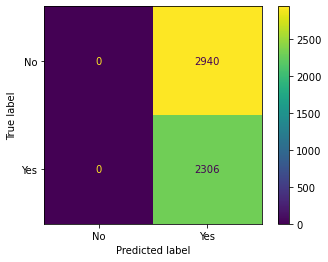

In [39]:
# Cross Validation Scores
cv_scores(dummy_model)

Note: All of the models created below utilize a pipeline that include the preprocessing steps in order to avoid data leakage. <br>

### First Model: Decision Tree 

The first model I created was a decision tree with all default parameters. My goal here was to purposefully create an overfit model in order to confirm it achieves a high recall score. Accomplishing this shows that I am using good enough data in order to predict the target variable.

In [40]:
# Creating steps for a Pipeline 
tree_steps = [('preprocess', preprocessor),
              ('tree', DecisionTreeClassifier())]

# Feeding the Pipeline the steps defined above
tree_pipe = Pipeline(tree_steps)

# Fitting the training data to the Pipeline
tree_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/tree_pipe.pkl', 'wb') as f:
    pickle.dump(tree_pipe, f)

In [41]:
# Load the pickled model
with open('pickled_models/tree_pipe.pkl', 'rb') as f:
    tree_pipe = pickle.load(f)

This worked successfully, this model received a recall score of 100% on the training data but below 50% on the cross validation, showing this model is very overfit. 

Train Recall:  1.0
CV Recall:  0.45966419697439215

Train Accuracy:  1.0
CV Accuracy:  0.5234485450996413


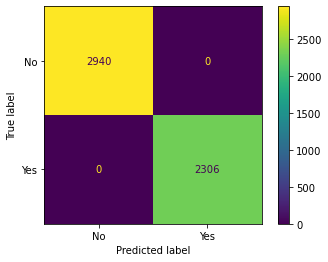

In [42]:
# Cross Validation Scores
cv_scores(tree_pipe)

### Second Model: Random Forest

The decision tree certainly held promise, so I decided to use a random forest which would be able to combine the power of many decision trees. I first created a random forest model with default parameters.

In [43]:
# Creating steps for a Pipeline 
forest_steps = [('preprocess', preprocessor),
                ('forest', RandomForestClassifier(random_state=333))]

# Feeding the Pipeline the steps defined above
forest_pipe = Pipeline(forest_steps)

# Fitting the training data to the Pipeline
forest_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_pipe.pkl', 'wb') as f:
    pickle.dump(forest_pipe, f)

In [44]:
# Load the pickled model
with open('pickled_models/forest_pipe.pkl', 'rb') as f:
    forest_pipe = pickle.load(f)

This model is even more overfit than the Decision Tree. Tuning the parameters should be able to adjust that. 

Train Recall:  1.0
CV Recall:  0.30399188663830745

Train Accuracy:  1.0
CV Accuracy:  0.5947385718825184


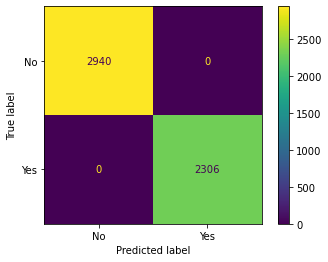

In [45]:
# Evaluate the model
cv_scores(forest_pipe)

#### Random Forest with Grid Search 1

In order to combat the overfit results I used a GridSearch to help tune the hyperparameters.


In [41]:
# Creating parameters for GridSearch
params = {'forest__n_estimators': [50, 100, 150],
          'forest__criterion': ['gini', 'entropy'],
          'forest__max_depth': [10, None],
          'forest__min_samples_split': [2],
          'forest__min_weight_fraction_leaf': [0, .5],
          'forest__max_features': ['auto', None, 15],
          'forest__max_leaf_nodes': [None, 10],
          'forest__min_impurity_decrease': [0, .5],
         }

# GridSearch with the random forest pipeline, parameters above, 5 fold cross validation, and accuracy score
forest_grid1 = GridSearchCV(estimator=forest_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
forest_grid1.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_grid1_best.pkl', 'wb') as f:
    pickle.dump(forest_grid1_best, f)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10,

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   1.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   2.0s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, for

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, fores

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   2.7s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   2.8s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fores

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__m

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fore

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, fore

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.0s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.9s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__m

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fore

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.5s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.5s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, f

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, f

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_dept

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_d

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, fo

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  fore

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criteri

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   2.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   2.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.5s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  fore

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.0s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.0s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, 

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criteri

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   1.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   1.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, f

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fores

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entro

[Parallel(n_jobs=1)]: Done 1440 out of 1440 | elapsed:  9.3min finished


In [52]:
# Load the pickled model
with open('pickled_models/forest_grid1_best.pkl', 'rb') as f:
    forest_grid1_best = pickle.load(f)

This has a slightly better recall score than the basic Random Forest but is still very overfit. 

In [55]:
# Evaluate the model
grid_results(forest_grid1_best)

Recall
Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['Age',
                                                   'Semester_Credit_Load',
                                                   'CGPA']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Course', 'Gender',
                                                   'Relationship_Status',
                                                   'Family_History',
                                                   'Residence_Type',
                                                   'Chronic_Illness']),
                                                 ('ord',
                                                  OrdinalEncoder(categorie

TypeError: '<' not supported between instances of 'str' and 'float'

Attemped a second grid search.

#### Random Forest with Grid Search 2

Hyperparameter Updates:
- n_estimators selected 50 so I provided more options around 50.
- criterion selcted 'gini' so I kept it as 'gini'.
- max_depth was None so I gave two more options for larger max_depth.
- min_samples_split was kept as default 2 last time so now I gave the option of 3.
- min_weight_fraction_leaf was selected as 0 so I offered more options closer to 0.
- max_features was selected as 15 so I narrowed the scope of options to be around 15.
- max_leaf_nodes was selected as None so I adjusted the option from 10 to 20.
- min_impurity_decrease was selected as 0 so I dropped the other option from .5 to .25.

In [45]:
# Creating parameters for GridSearch
params = {'forest__n_estimators': [50, 100, 40, 60],
          'forest__criterion': ['gini'],
          'forest__max_depth': [30, 100, None],
          'forest__min_samples_split': [3, 2],
          'forest__min_weight_fraction_leaf': [0, .75, .5, .25],
          'forest__max_features': [15, 20, 10, 'auto'],
          'forest__max_leaf_nodes': [None, 20],
          'forest__min_impurity_decrease': [0, .25],
         }

# GridSearch with the random forest pipeline, parameters above, 5 fold cross validation, and accuracy score
forest_grid2 = GridSearchCV(estimator=forest_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
forest_grid2.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_grid2.pkl', 'wb') as f:
    pickle.dump(forest_grid2, f)

Fitting 5 folds for each of 1536 candidates, totalling 7680 fits
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=3

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, for

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=3

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, for

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, for

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.9s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gin

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.9s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.9s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fores

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, for

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criteri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criteri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criteri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   1.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   1.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini,

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini,

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, f

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, for

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__cri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criteri

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__crit

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__cri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criteri

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__crit

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fores

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini,

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[Parallel(n_jobs=1)]: Done 7680 out of 7680 | elapsed: 27.9min finished


In [46]:
# Load the pickled model
with open('pickled_models/forest_grid2.pkl', 'rb') as f:
    forest_grid2 = pickle.load(f)

This has a slightly better recall score but is still very overfit. 

Recall
Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['Age',
                                                   'Semester_Credit_Load',
                                                   'CGPA']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Course', 'Gender',
                                                   'Relationship_Status',
                                                   'Family_History',
                                                   'Residence_Type',
                                                   'Chronic_Illness']),
                                                 ('ord',
                                                  OrdinalEncoder(categorie

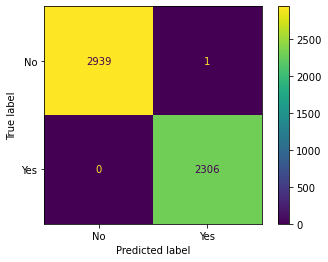

In [47]:
grid_results(forest_grid2)

#### Random Forest with Grid Search 3

Tried to improve results with Grid Search.

Hyperparameter Updates:
- n_estimators selected 40 so I kept it there to further analyze other hyperparameters.
- criterion stayed at 'gini'.
- max_depth was 30 instead of None or 100 so I gave it 60 to see which of those two it would take.
- min_samples_split was 3 so now I gave the option of 4 because it increased from 2.
- min_weight_fraction_leaf was again selected as 0 so I stayed at 0.
- max_features was selected as 15 so I kept it at 15 but also gave the option of None.
- max_leaf_nodes was selected as None so I drastically increased the options to see if a larger number would take.
- min_impurity_decrease was only given at 0 and I stayed with that.

In [48]:
# Creating parameters for GridSearch
params = {'forest__n_estimators': [40],
          'forest__criterion': ['gini'],
          'forest__max_depth': [30, 60],
          'forest__min_samples_split': [3, 4],
          'forest__min_weight_fraction_leaf': [0],
          'forest__max_features': [15, None],
          'forest__max_leaf_nodes': [100, 500, None, 300, 1000],
          'forest__min_impurity_decrease': [0],
         }

# GridSearch with the random forest pipeline, parameters above, 5 fold cross validation, and accuracy score
forest_grid3 = GridSearchCV(estimator=forest_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
forest_grid3.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_grid3.pkl', 'wb') as f:
    pickle.dump(forest_grid3, f)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, fo

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, fo

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.8min finished


In [49]:
# Load the pickled model
with open('pickled_models/forest_grid3.pkl', 'rb') as f:
    forest_grid3 = pickle.load(f)

This cross validation recall score barely improved and the model is still overfit.

Recall
Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['Age',
                                                   'Semester_Credit_Load',
                                                   'CGPA']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Course', 'Gender',
                                                   'Relationship_Status',
                                                   'Family_History',
                                                   'Residence_Type',
                                                   'Chronic_Illness']),
                                                 ('ord',
                                                  OrdinalEncoder(categorie

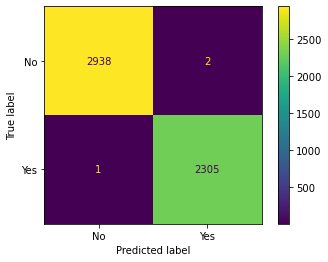

In [50]:
grid_results(forest_grid3)

The recall score increased a bit but the accuracy decreased. While there is much more tweaking to be done on this model, I decided to use a Gradient Boosting Classifier (shown further down) to continue this plunge because that is also a tree-based model. 

For now, I decided to get a peak at what a Logistic Regression model looked like.

### Third Model: Logistic Regression

Created a Logistic Regression model with default parameters.

In [51]:
# Creating steps for a Pipeline 
logreg_steps = [('preprocess', preprocessor),
                ('logreg', LogisticRegression(random_state=333))]

# Feeding the Pipeline the steps defined above
logreg_pipe = Pipeline(logreg_steps)

# Fitting the training data to the Pipeline
logreg_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_pipe.pkl', 'wb') as f:
    pickle.dump(logreg_pipe, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_pipe.pkl', 'rb') as f:
    logreg_pipe = pickle.load(f)

The model does not appear to be overfit, but it is extremely underfit. 

In [ ]:
cv_scores(logreg_pipe)

My first goal was to make the model overfit to ensure that the data could be used in a meaningful way by the model.

#### Logistic Regression with Grid Search 1

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [1, 0.0001],
                'logreg__solver': ['lbfgs', 'sag', 'saga'],
                'logreg__max_iter': [100],
                'logreg__penalty': ['l1', 'l2']}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logreg_grid1 = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logreg_grid1.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_grid1.pkl', 'wb') as f:
    pickle.dump(logreg_grid1, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_grid1.pkl', 'rb') as f:
    logreg_grid1 = pickle.load(f)

The model successfully overfit and has the highest recall score of any model thus far! 

In [ ]:
grid_results(logreg_grid1)

Tried to improve the results with another Grid Search.

#### Logistic Regression with Grid Search 2

Hyperparameter Updates:
- class_weight was selected as None but I kept both in to see how they 

The grid search selected C=0.0001, class_weight='balanced', penalty='l1', and solver='saga' as the best hyperparameters.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced'],
                'logreg__C': [.0001, .00001, .001],
                'logreg__solver': ['saga', 'liblinear', 'newton-cg'],
                'logreg__max_iter': [50, 100, 150, 1000],
                'logreg__penalty': ['elasticnet', 'l1', None]}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logreg_grid2 = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logreg_grid2.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_grid2.pkl', 'wb') as f:
    pickle.dump(logreg_grid2, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_grid2.pkl', 'rb') as f:
    logreg_grid2 = pickle.load(f)

The grid search did not change any of the scores. 

In [ ]:
grid_results(logreg_grid2)

The grid search selected C=0.0001, class_weight='balanced', max_iter=50, penalty='l1', and solver='saga' as the best hyperparameters.

#### Logistic Regression with Grid Search 3

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced'],
                'logreg__C': [1, .01, .001],
                'logreg__solver': ['saga'],
                'logreg__max_iter': [25, 75],
                'logreg__penalty': ['l1']}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logreg_grid3 = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logreg_grid3.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_grid3.pkl', 'wb') as f:
    pickle.dump(logreg_grid3, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_grid3.pkl', 'rb') as f:
    logreg_grid3 = pickle.load(f)

This still did not change the scores in a meaningful way.

In [ ]:
grid_results(logreg_grid3)

In order to see an improvement with the model I decided to add polynomial features.

### Fourth Model: Logistic Regression with Polynomial Features

In [ ]:
# Creating steps for a Pipeline 
logregpoly_steps = [('preprocess', preprocessor),
                ('polynomials', PolynomialFeatures()),
                ('logreg', LogisticRegression(max_iter=1000, random_state=333))]

# Feeding the Pipeline the steps defined above
logregpoly_pipe = Pipeline(logregpoly_steps)

# Fitting the training data to the Pipeline
logregpoly_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logregpoly_pipe.pkl', 'wb') as f:
    pickle.dump(logregpoly_pipe, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logregpoly_pipe.pkl', 'rb') as f:
    logregpoly_pipe = pickle.load(f)

This recall score is already better than the logistic regression with default parameters but is still very underfit. 

In [ ]:
cv_scores(logregpoly_pipe)

My first goal was to make this model overfit so then I could fine tune it.

#### Logistic Regression with Polynomial Features with Grid Search 1

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [1, .01, .001],
                'logreg__solver': ['saga'],
                'logreg__max_iter': [1000, 2000],
                'logreg__penalty': ['l1', 'l2']}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logregpoly_grid1 = GridSearchCV(estimator=logregpoly_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logregpoly_grid1.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logregpoly_grid1.pkl', 'wb') as f:
    pickle.dump(logregpoly_grid1, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logregpoly_grid1.pkl', 'rb') as f:
    logregpoly_grid1 = pickle.load(f)

This model is much better on recall! It is overfit as I was aiming and it is the highest recall score I've gotten so far. Now I wanted to make it a bit less overfit and see if I can increase the accuracy score as well because right now it may just be choosing 'Yes' majority of the time, which maximizes recall, but is not very accurate.

In [ ]:
grid_results(logregpoly_grid1.best_estimator_)

The grid search selected C=0.001, class_weight='balanced', max_iter=1000, penalty='l1', and solver='saga' as the best hyperparamaters.

#### Logistic Regression with Polynomial Features with Grid Search 2

Tried to improve results with GridSearch.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced'],
                'logreg__C': [.001, .0001],
                'logreg__solver': ['saga', 'sag', 'lbfjs'],
                'logreg__max_iter': [600, 800, 1000],
                'logreg__penalty': ['l1', 'none'],
         'polynomials__degree': [2]}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logregpoly_grid2 = GridSearchCV(estimator=logregpoly_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logregpoly_grid2.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/logregpoly_grid2.pkl', 'wb') as f:
    pickle.dump(logregpoly_grid2.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/logregpoly_grid2.pkl', 'rb') as f:
    logregpoly_grid2.best_estimator_ = pickle.load(f)

This grid search resulted in the same cross validation scores for recall and accuracy. While the recall score is great, the accuracy is only about 2% better than my Dummy Model of predicting "At Risk" everytime. I decided to create a few Logistic Regression models focused on accuracy to see if I could then stack them in the hopes of finding a happy medium. 

In [ ]:
grid_results(logregpoly_grid2.best_estimator_)

ADD HERE INFO AND EDIT LOGREG WITH RANDOM AND GRID SEARCH TO USE LOGREGPOLY_PIPE TO HELP OVERFIT THE MODEL

#### Logistic Regression with Randomized Search (Accuracy) 1

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [1, 0.01, 0.0001],
                'logreg__solver': ['liblinear','lbfgs', 'sag', 'saga'],
                'logreg__max_iter': [100, 50],
                'logreg__penalty': ['l1', 'l2', 'elasticnet', None]}

# RandomizedSearch
logreg_grid1_acc = RandomizedSearchCV(estimator=logreg_pipe, param_distributions=params, cv=5, n_iter=50, n_jobs=3, random_state=333)

# Fitting the GridSearch
logreg_grid1_acc.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/logreg_random1_acc_best.pkl', 'wb') as f:
    pickle.dump(logreg_random1_acc.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/logreg_random1_acc_best.pkl', 'rb') as f:
    logreg_random1_acc_best = pickle.load(f)

After the first RandomizedSearch the recall score is poor but the accuracy score is better. I decided to tweak the paramters to see if the scores could get better.

In [ ]:
grid_results(logreg_random1_acc_best)

#### Logistic Regression with Randomized Search (Accuracy) 2

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [.1, 0.01, 0.001],
                'logreg__solver': ['liblinear','lbfgs', 'sag', 'saga'],
                'logreg__max_iter': [150, 100, 75],
                'logreg__penalty': ['l1', 'l2', 'elasticnet', None]}

# RandomizedSearch
logreg_grid2_acc = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, n_jobs=3)

# Fitting the GridSearch
logreg_grid2_acc.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/logreg_grid2_acc_best.pkl', 'wb') as f:
    pickle.dump(logreg_grid2_acc.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/logreg_grid2_acc_best.pkl', 'rb') as f:
    logreg_grid2_acc_best = pickle.load(f)b

The scores did not chage so I tried one more attempt at tweaking the parameters.

#### Logistic Regression with Randomized Search (Accuracy) 3

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [.1, 0.15, 0.05],
                'logreg__solver': ['liblinear','lbfgs', 'sag', 'saga'],
                'logreg__max_iter': [150, 200, 700],
                'logreg__penalty': ['l1', 'l2', 'elasticnet', None]}

# RandomizedSearch
logreg_grid3_acc = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, n_jobs=3)

# Fitting the GridSearch
logreg_grid3_acc.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/logreg_grid3_acc_best.pkl', 'wb') as f:
    pickle.dump(logreg_grid3_acc.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/logreg_grid3_acc_best.pkl', 'rb') as f:
    logreg_grid3_acc_best = pickle.load(f)

The scores still stayed the same. 

In [ ]:
grid_results(logreg_grid3_acc_best)

With an accuracy score of 62% I decided to stack this model with my best Logistic Regression model without polynomials with a recall score of 60% to see if I could create a happy medium for the two metrics.

### Fifth Model: Stacking Classifier 

HERE WAIT UNTIL CHANGE ABOVE TO USE POLYS -> IN STACKING USE BEST LOGREG WITH POLYNOMIALS!

The Logistic Regression model was aggressively applying regularization in order to improve the recall. While the recall score did rise, the accuracy score was not as good as I was hoping. I decided to try a Gradient Boosting Classifier to see if tweaking of the forests could address the overfitting I saw earlier in the Random Forests.

### Sixth Model: Gradient Boosting Classifier

In [ ]:
# Creating steps for a Pipeline 
gbc_steps = [('preprocess', preprocessor),
                ('gbc', GradientBoostingClassifier(random_state=333))]

# Feeding the Pipeline the steps defined above
gbc_pipe = Pipeline(gbc_steps)

# Fitting the training data to the Pipeline
gbc_pipe.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/gbc_pipe.pkl', 'wb') as f:
    pickle.dump(gbc_pipe, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/gbc_pipe.pkl', 'rb') as f:
    gbc_pipe = pickle.load(f)

The initial gradient boosting classifier with default parameters showed a pretty bad recall score with a decent accuracy score. Both however, were very underfit. Again, my first goal was to run a grid search in an attempt to overfit the model.

In [ ]:
cv_scores(gbc_pipe)

#### Gradient Boosting Classifier with Grid Search 1

In [ ]:
# Creating parameters for GridSearch
params = {'gbc__loss': ['exponential', 'deviance'],
          'gbc__learning_rate': [0.01, .1, 1],
          'gbc__n_estimators': [100, 200],
         'gbc__min_samples_split': [2, 3],
         'gbc__max_depth': [3, None]}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
gbc_grid1 = GridSearchCV(estimator=gbc_pipe, param_grid=params, cv=5, scoring=recall_scorer, n_jobs=3, verbose=2)

# Fitting the GridSearch
gbc_grid1.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/gbc_grid1_best.pkl', 'wb') as f:
    pickle.dump(gbc_grid1.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/gbc_grid1_best.pkl', 'rb') as f:
    gbc_grid1_best = pickle.load(f)

The initial grid search was successful in overfitting the model. It increased the recall score and decreased the accuracy score, but now I was able to tune the model and try to increase both metrics from that starting point.

In [ ]:
grid_results(gbc_grid1_best)

#### Gradient Boosting Classifier with Grid Search 2

In [ ]:
# Creating parameters for GridSearch
params = {'gbc__loss': ['exponential', 'deviance'],
          'gbc__learning_rate': [0.01, .1, 1],
          'gbc__n_estimators': [100, 200, 300],
         'gbc__min_samples_split': [2, 3],
         'gbc__max_depth': [10, 30, None]}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
gbc_grid2 = GridSearchCV(estimator=gbc_pipe, param_grid=params, cv=5, scoring=recall_scorer, n_jobs=3)

# Fitting the GridSearch
gbc_grid2.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/gbc_grid2_best.pkl', 'wb') as f:
    pickle.dump(gbc_grid2.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/gbc_grid2_best.pkl', 'rb') as f:
    gbc_grid2_best = pickle.load(f)

In [ ]:
grid_results(gbc_grid2_best)